In [1]:
from src.visualise import settings
from src.visualise.plot import plot_data, plot_data_simple
from src.data.paths import project_dir
from src.data.analysis import read_tiff_img, Circle, create_circular_mask
from src.data.detector import find_circle_hough_method, img_for_circle_detection

import numpy as np
import matplotlib.pyplot as plt
import scipy.ndimage as ndi
import re

from dataclasses import dataclass, field
from pathlib import Path

from copy import deepcopy

# Data structures

In [2]:
@dataclass(frozen=True)
class DetectorImage:
    image: np.ndarray
    path: Path

    @property
    def init_circle(self) -> Circle:
        return Circle(x=self.image.shape[0]//2, y=self.image.shape[1]//2, r=100)

@dataclass(frozen=True)
class DetectorData:
    raw: DetectorImage
    lv: DetectorImage
    det_no: int
    circle: Circle = field(default=Circle())

@dataclass(frozen=True)
class DetectorDataCollection:
    path: Path
    data: dict[int, DetectorData] = field(default_factory=dict)

    def __post_init__(self):
        if not self.data:
            self._load_data()

    def _load_data(self):
        for file_path in sorted(self.path.iterdir()):
            if file_path.name.endswith('lv'):
                # get detector data
                det_id = re.findall(r'\d+', file_path.name)[0]
                det_no = int(det_id)
                # live view images
                lv_path = next(file_path.glob('**/*tif'))
                lv_data = read_tiff_img(lv_path, border_px=0)
                lv_image = DetectorImage(image=lv_data, path=lv_path)
                # raw data images
                try:
                    raw_path = next((self.path / det_id).glob('**/*tif'))
                    raw_data = read_tiff_img(raw_path, border_px=0)
                    raw_image = DetectorImage(image=raw_data, path=raw_path)
                    det_data = DetectorData(raw=raw_image, lv=lv_image, det_no=det_no)
                    self.data[det_no] = det_data
                    print(f"{det_no} ", end='')
                except StopIteration:
                    print(f"missing_{det_no} ", end='')

In [3]:
#raw_path = project_dir / 'data' / 'raw' / '2024-04-22' / 'PB'
raw_path = Path('C:\\Users\\Legion\\OneDrive - ifj.edu.pl\\Projects\\MB_foils\\2024-05-28_PB_silicon_20Gy\\2024-05-28_PB_20Gy')
proton_raw_data = DetectorDataCollection(path=raw_path)

2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 

In [4]:
#co60_path = project_dir / 'data' / 'raw' / 'Co60'
co60_path = Path('C:\\Users\\Legion\\OneDrive - ifj.edu.pl\\Projects\\MB_foils\\2024-05-28_PB_silicon_20Gy\\2024-05-13_Co60_silicon')
co60_raw_data = DetectorDataCollection(path=co60_path)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 

In [5]:
bg_path = Path('C:\\Users\\Legion\\OneDrive - ifj.edu.pl\\Projects\\MB_foils\\2024-05-28_PB_silicon_20Gy\\2024-05-20_tlo')
bg_raw_data = DetectorDataCollection(path=bg_path)

2 3 4 5 6 8 9 10 11 12 13 14 15 16 

## Output paths

In [6]:
base_output_path = Path('C:\\Users\\Legion\\OneDrive - ifj.edu.pl\\Projects\\MB_foils\\2024-05-28_PB_silicon_20Gy\\data\\interim')
proton_output_path = base_output_path / 'PB_20Gy'
co60_output_path = base_output_path / 'Co60'
bg_output_path = base_output_path / 'tlo'

# remove base output path
import shutil
shutil.rmtree(base_output_path, ignore_errors=True)

# create output paths
proton_output_path.mkdir(parents=True)
co60_output_path.mkdir(parents=True)
bg_output_path.mkdir(parents=True)

# Proton raw data

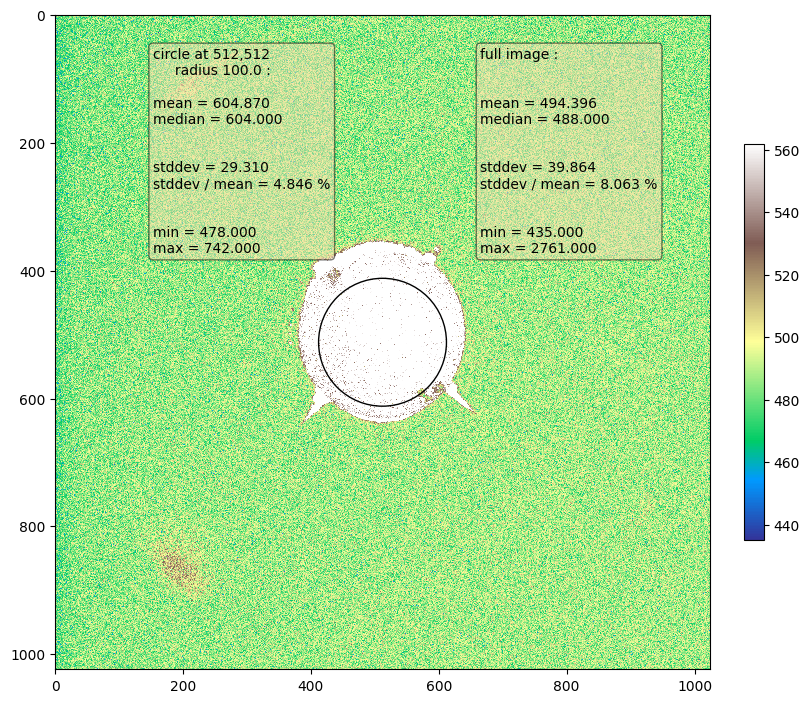

In [10]:
det_id = 2
fig, ax = plot_data_simple(proton_raw_data.data[det_id].lv.image, circle_px=proton_raw_data.data[det_id].lv.init_circle)

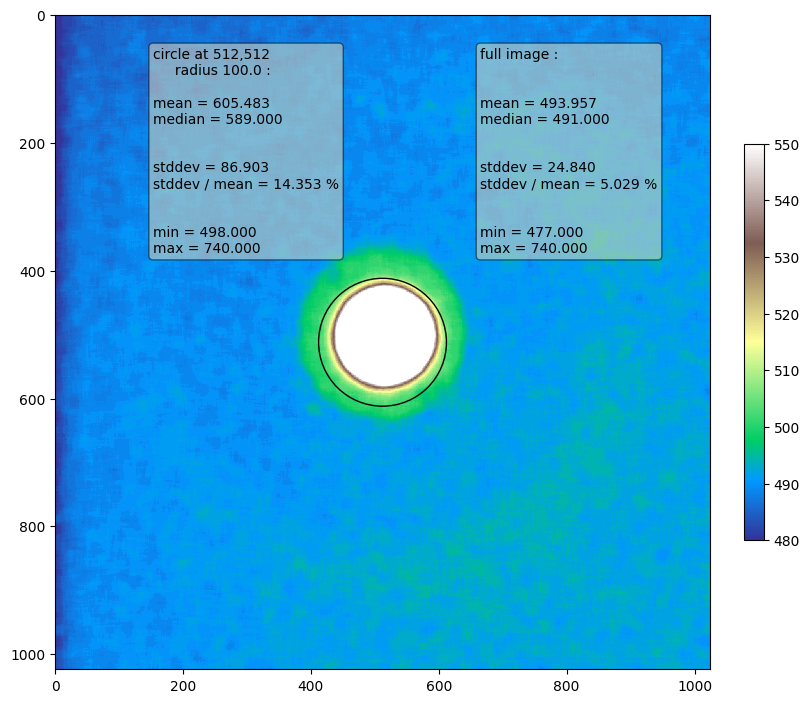

In [14]:
fig, ax = plot_data_simple(ndi.median_filter(proton_raw_data.data[det_id].raw.image, size=19), circle_px=proton_raw_data.data[det_id].raw.init_circle, clip=False, vmin=480, vmax=550)

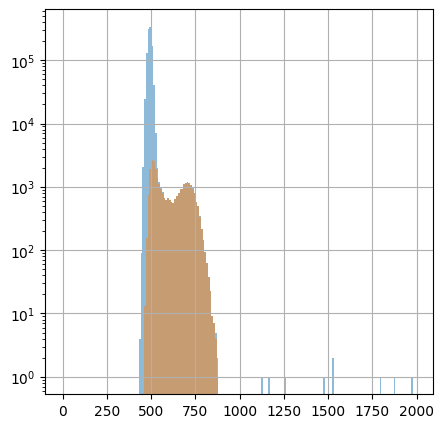

In [15]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
bins = np.arange(0, 2000, 10)
mask = create_circular_mask(proton_raw_data.data[det_id].raw.image, proton_raw_data.data[det_id].raw.init_circle)
ax.hist(proton_raw_data.data[det_id].raw.image.flatten(), bins=bins, alpha=0.5, label='raw');
ax.hist(proton_raw_data.data[det_id].raw.image[mask].flatten(), bins=bins, alpha=0.5, label='raw mask');
ax.set_yscale('log')
ax.grid()

# Co60 raw data

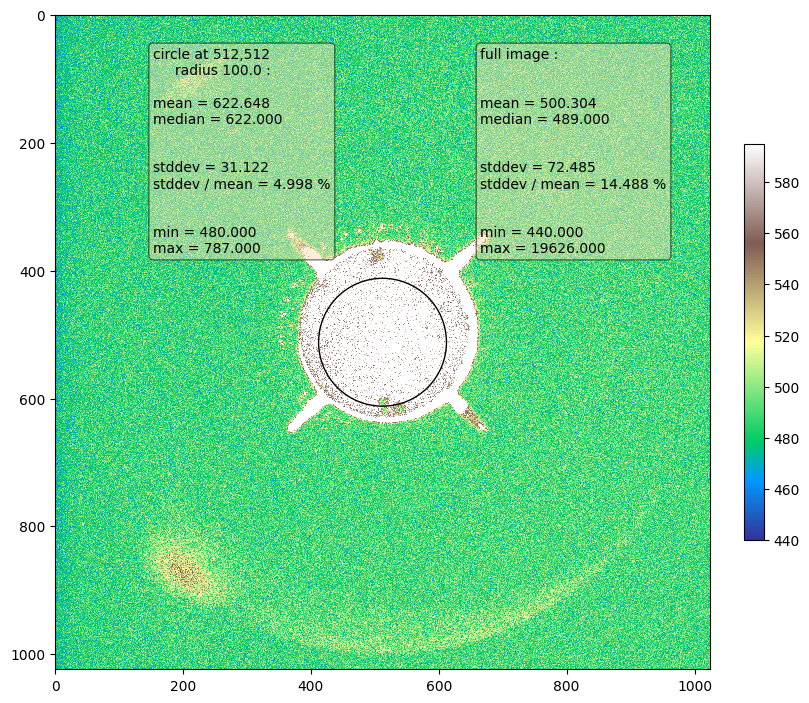

In [16]:
fig, ax = plot_data(co60_raw_data.data[2].lv.image, circle_px=co60_raw_data.data[2].lv.init_circle)

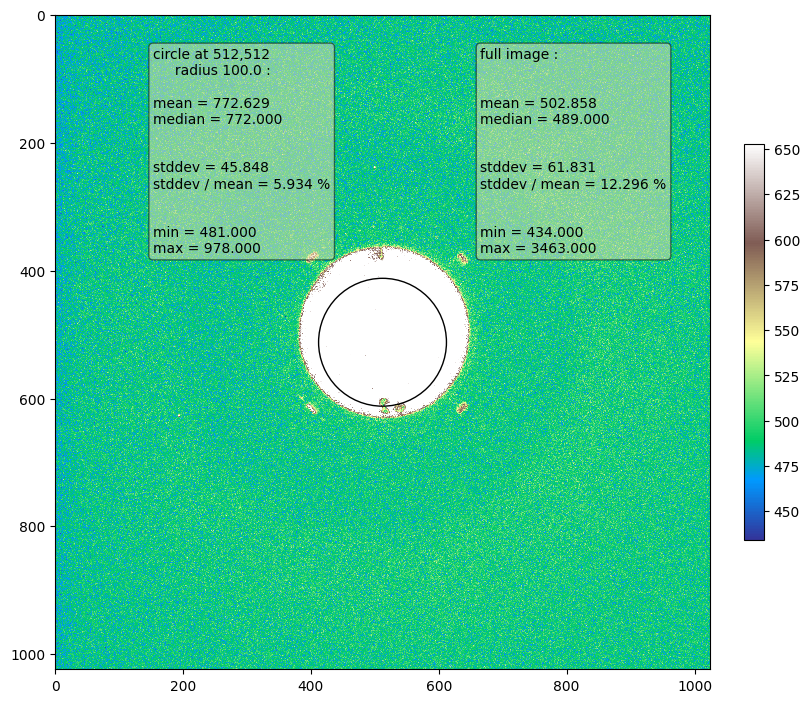

In [17]:
fig, ax = plot_data_simple(co60_raw_data.data[2].raw.image, circle_px=co60_raw_data.data[2].raw.init_circle)

## Background

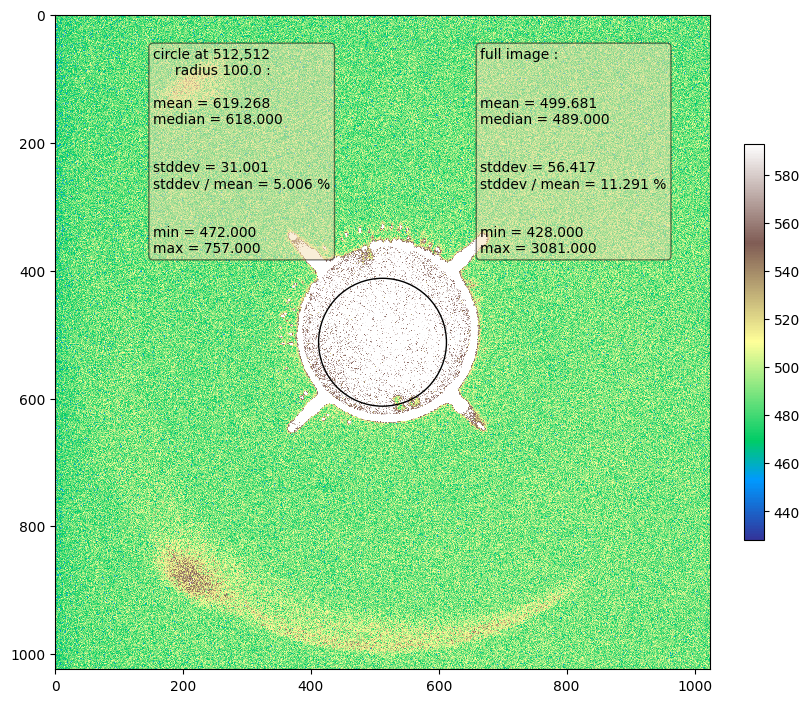

In [18]:
fig, ax = plot_data(bg_raw_data.data[2].lv.image, circle_px=bg_raw_data.data[2].lv.init_circle)

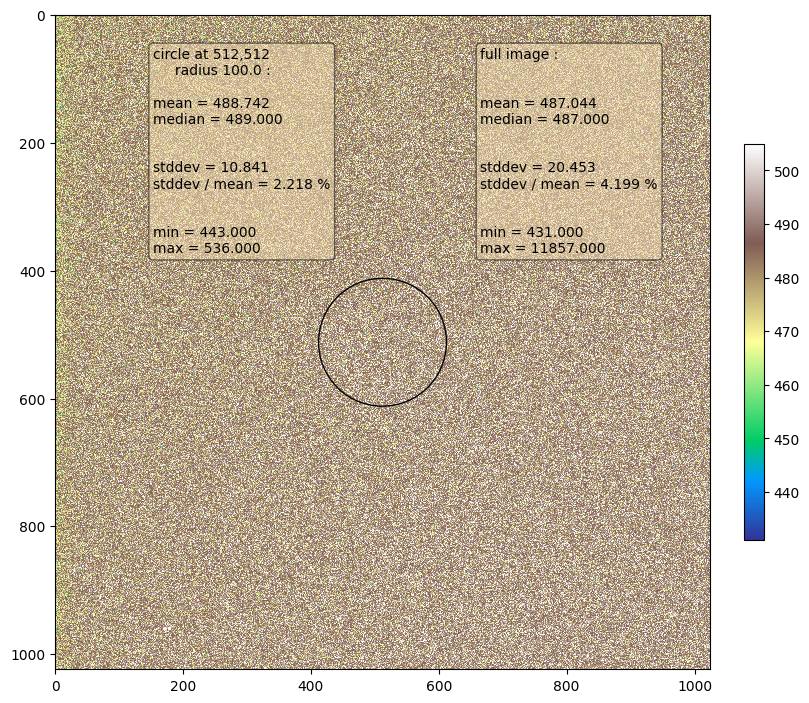

In [19]:
fig, ax = plot_data(bg_raw_data.data[2].raw.image, circle_px=bg_raw_data.data[2].raw.init_circle)

In [20]:
# background_path = next((project_dir / 'data' / 'raw' / '2024-02-20').parent.glob('**/*background*/**/**/*tif'))
# background_data = DetectorImage(path=background_path, image=read_tiff_img(background_path, border_px=0))
background_data = bg_raw_data.data[2].raw

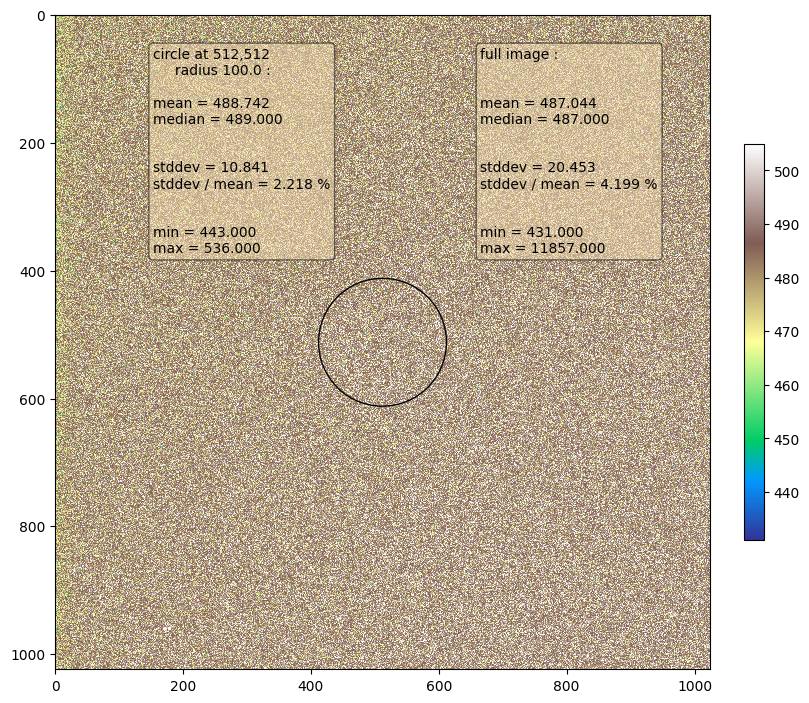

In [21]:
fig, ax = plot_data(background_data.image, circle_px=background_data.init_circle)

# Save plots

## Save LV without detector

In [22]:
# for plot_output_path, dataset in zip(
#     [proton_output_path, co60_output_path, bg_output_path],
#     [proton_raw_data, co60_raw_data, bg_raw_data]):

#     # save plots from all detectors
#     plot_path = plot_output_path / 'live_view'
#     plot_path.mkdir(parents=True, exist_ok=True)

#     # set vmin to the 5% centile of all images and vmax to 95% centile
#     concatenated_flattened_lv_data = np.concatenate([data.lv.image.flatten() for data in dataset.data.values()])
#     vmin = np.nanpercentile(a=concatenated_flattened_lv_data, q=5)
#     vmax = np.nanpercentile(a=concatenated_flattened_lv_data, q=95)
#     print(f"vmin: {vmin}, vmax: {vmax}")

#     for det_no, data in dataset.data.items():
#         output_path = plot_path / f'lv_det{det_no:02d}'
#         output_path.unlink(missing_ok=True)
#         #print(f"Saving detector {det_no} / {len(dataset.data)} into {output_path}")
#         fig, ax = plot_data_simple(data.lv.image, circle_px=data.lv.init_circle, vmin=vmin, vmax=vmax, clip=False)
#         ax.set_title(f"Detector {det_no}")
#         fig.savefig(output_path)
#         plt.close(fig)

## Save raw data without detector

In [23]:
for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path, bg_output_path],
    [proton_raw_data, co60_raw_data, bg_raw_data]):

    # save plots from all detectors
    plot_path = plot_output_path / 'raw_data'
    plot_path.mkdir(parents=True, exist_ok=True)

    # get vmax from 90% centile of all images in the circle
    vmax_list = []
    for data in dataset.data.values():
        mask = create_circular_mask(data.raw.image, data.raw.init_circle)
        percentile = np.nanpercentile(a=data.raw.image[mask], q=90)
        vmax_list.append(percentile)
    vmax = max(vmax_list)

    concatenated_flattened_data = np.concatenate([data.raw.image.flatten() for data in dataset.data.values()])
    vmin = np.nanpercentile(a=concatenated_flattened_data, q=3)
    print(f"vmin: {vmin}, vmax: {vmax}")

    for det_no, data in dataset.data.items():
        output_path = plot_path / f'raw_data_det{det_no:02d}'
        output_path.unlink(missing_ok=True)
        fig, ax = plot_data_simple(data.raw.image, circle_px=data.raw.init_circle, vmin=vmin, vmax=vmax, clip=False)
        ax.set_title(f"Detector {det_no}")
        fig.savefig(output_path)
        plt.close(fig)

vmin: 468.0, vmax: 1494.0
vmin: 469.0, vmax: 870.0
vmin: 468.0, vmax: 506.0


# Background subtraction

In [24]:
proton_bg_sub_data = DetectorDataCollection(path=proton_raw_data.path, data=deepcopy(proton_raw_data.data))
for data in proton_bg_sub_data.data.values():
    # out data are save as uint16, dataclasses are frozen
    # its not straightforward to use np.crop(0) or cast to int64
    # therefore we shift data up, perform background subtraction, crop negative values and shift back
    np.add(data.raw.image, background_data.image.max(), out=data.raw.image)    
    np.subtract(data.raw.image, background_data.image, out=data.raw.image)
    np.clip(data.raw.image, a_min=background_data.image.max(), a_max=None, out=data.raw.image)
    np.subtract(data.raw.image, background_data.image.max(), out=data.raw.image)


In [25]:
co60_bg_sub_data = DetectorDataCollection(path=co60_raw_data.path, data=deepcopy(co60_raw_data.data))
for data in co60_bg_sub_data.data.values():

    # out data are save as uint16, dataclasses are frozen
    # its not straightforward to use np.crop(0) or cast to int64
    # therefore we shift data up, perform background subtraction, crop negative values and shift back
    np.add(data.raw.image, background_data.image.max(), out=data.raw.image)    
    np.subtract(data.raw.image, background_data.image, out=data.raw.image)
    np.clip(data.raw.image, a_min=background_data.image.max(), a_max=None, out=data.raw.image)
    np.subtract(data.raw.image, background_data.image.max(), out=data.raw.image)

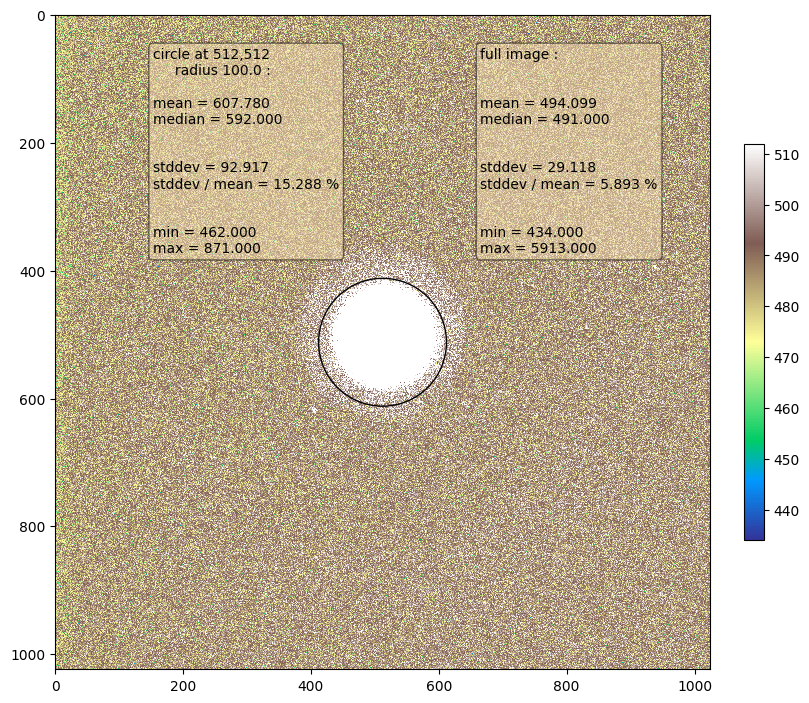

In [26]:
fig, ax = plot_data_simple(proton_raw_data.data[2].raw.image, circle_px=proton_raw_data.data[2].raw.init_circle)

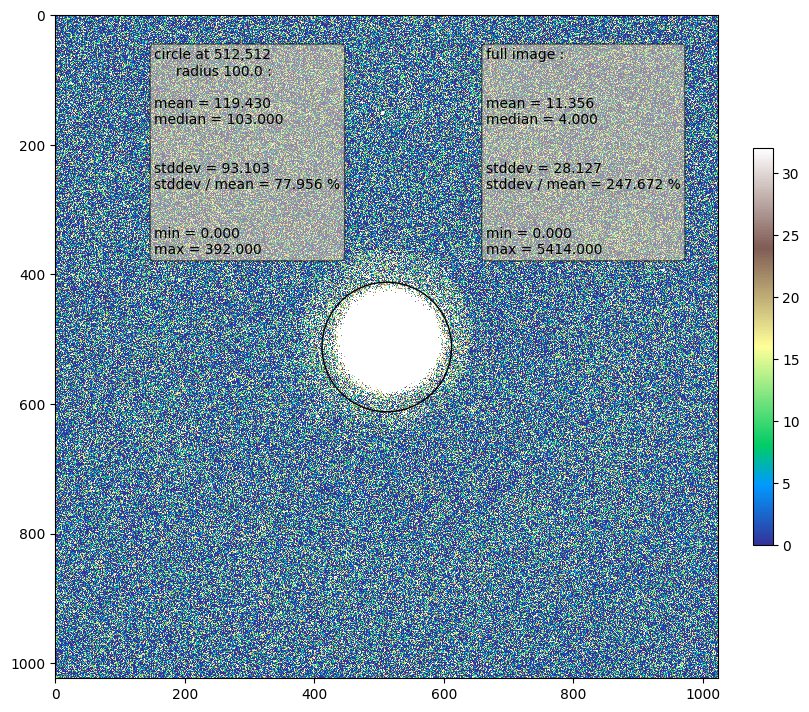

In [27]:
fig, ax = plot_data(proton_bg_sub_data.data[2].raw.image, circle_px=proton_bg_sub_data.data[2].raw.init_circle)

In [28]:
# for plot_output_path, dataset in zip(
#     [proton_output_path, co60_output_path],
#     [proton_bg_sub_data, co60_bg_sub_data]):

#     # save plots from all detectors
#     plot_path = plot_output_path / 'bg_sub_data'
#     plot_path.mkdir(parents=True, exist_ok=True)

#     # get vmax from 90% centile of all images in the circle
#     vmax_list = []
#     for data in dataset.data.values():
#         mask = create_circular_mask(data.raw.image, data.raw.init_circle)
#         percentile = np.nanpercentile(a=data.raw.image[mask], q=90)
#         vmax_list.append(percentile)
#     vmax = max(vmax_list)

#     concatenated_flattened_data = np.concatenate([data.raw.image.flatten() for data in dataset.data.values()])
#     vmin = np.nanpercentile(a=concatenated_flattened_data, q=3)
#     print(f"vmin: {vmin}, vmax: {vmax}")

#     for det_no, data in dataset.data.items():
#         output_path = plot_path / f'PB_det{det_no:02d}'
#         output_path.unlink(missing_ok=True)
#         fig, ax = plot_data_simple(data.raw.image, circle_px=data.raw.init_circle, vmin=vmin, vmax=vmax, clip=False)
#         ax.set_title(f"Detector {det_no}")
#         fig.savefig(output_path)
#         plt.close(fig)

# Detector discovery

In [29]:
det_data_dict = {}
for data in proton_bg_sub_data.data.values():
    lv_for_detect = img_for_circle_detection(data.lv.image)
    circle = find_circle_hough_method(lv_for_detect)
    det_data = DetectorData(raw=data.raw, lv=data.lv, det_no=data.det_no, circle=circle)
    det_data_dict[data.det_no] = det_data
    print(f"{data.det_no} ", end='')
proton_det_data = DetectorDataCollection(path=proton_raw_data.path, data=det_data_dict)

2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 

In [30]:
det_data_dict = {}
for data in co60_bg_sub_data.data.values():
    lv_for_detect = img_for_circle_detection(data.lv.image)
    circle = find_circle_hough_method(lv_for_detect)
    det_data = DetectorData(raw=data.raw, lv=data.lv, det_no=data.det_no, circle=circle)
    det_data_dict[data.det_no] = det_data
    print(f"{data.det_no} ", end='')
co60_det_data = DetectorDataCollection(path=co60_raw_data.path, data=det_data_dict)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 

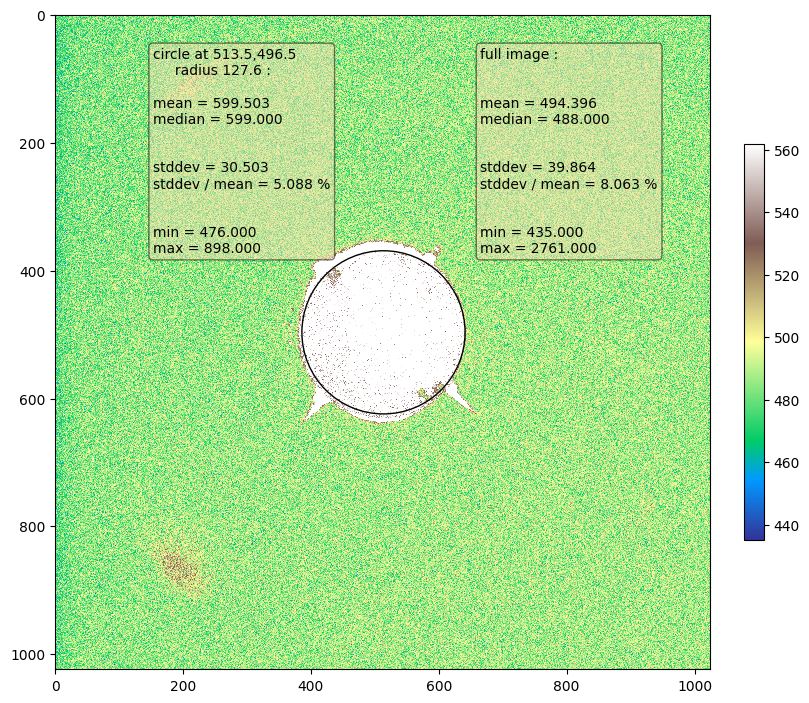

In [31]:
detid = 2 
fig, ax = plot_data(proton_det_data.data[detid].lv.image, circle_px=proton_det_data.data[detid].circle)

In [32]:
mean_radius = np.mean([data.circle.r for data in proton_det_data.data.values()])
mean_radius_mm = 10.0
px_to_mm = mean_radius_mm / mean_radius
px_to_mm

0.0784313725490196

In [33]:
# fig, ax = plt.subplots(2, 3, figsize=(12, 8))
# for data in proton_det_data.data.values():
#     ax[0, 0].plot(data.det_no, data.circle.x, '.')
#     ax[0, 1].plot(data.det_no, data.circle.y, '.')
#     ax[0, 2].plot(data.det_no, data.circle.r, '.')
# for data in co60_det_data.data.values():
#     ax[1, 0].plot(data.det_no, data.circle.x, '.')
#     ax[1, 1].plot(data.det_no, data.circle.y, '.')
#     ax[1, 2].plot(data.det_no, data.circle.r, '.')
# for a in ax.flat:
#     a.grid()
# for a in ax[0]:
#     a.set_xlabel('Proton det no')
# for a in ax[1]:
#     a.set_xlabel('Co60 det no')
# for a in ax[:, 0]:
#     a.set_ylabel('Det center x [px]')
# for a in ax[:, 1]:
#     a.set_ylabel('Det center y [px]')
# for a in ax[:, 2]:
#     a.set_ylabel('Det radius [px]')
# fig.tight_layout()

In [34]:
# fig, ax = plt.subplots(2, 3, figsize=(12, 8))
# for data in proton_det_data.data.values():
#     ax[0, 0].plot(data.det_no, data.circle.x * px_to_mm, '.')
#     ax[0, 1].plot(data.det_no, data.circle.y * px_to_mm, '.')
#     ax[0, 2].plot(data.det_no, data.circle.r * px_to_mm, '.')
# for data in co60_det_data.data.values():
#     ax[1, 0].plot(data.det_no, data.circle.x * px_to_mm, '.')
#     ax[1, 1].plot(data.det_no, data.circle.y * px_to_mm, '.')
#     ax[1, 2].plot(data.det_no, data.circle.r * px_to_mm, '.')
# for a in ax.flat:
#     a.grid()
# for a in ax[0]:
#     a.set_xlabel('Proton det no')
# for a in ax[1]:
#     a.set_xlabel('Co60 det no')
# for a in ax[:, 0]:
#     a.set_ylabel('Det center x [mm]')
# for a in ax[:, 1]:
#     a.set_ylabel('Det center y [mm]')
# for a in ax[:, 2]:
#     a.set_ylabel('Det radius [mm]')
# fig.tight_layout()

## Save plots with detector

In [35]:
for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path],
    [proton_det_data, co60_det_data]):

    # save plots from all detectors
    plot_path = plot_output_path / 'live_view'
    plot_path.mkdir(parents=True, exist_ok=True)

    # set vmin to the 5% centile of all images and vmax to 95% centile
    concatenated_flattened_lv_data = np.concatenate([data.lv.image.flatten() for data in dataset.data.values()])
    vmin = np.nanpercentile(a=concatenated_flattened_lv_data, q=5)
    vmax = np.nanpercentile(a=concatenated_flattened_lv_data, q=95)
    print(f"vmin: {vmin}, vmax: {vmax}")

    for det_no, data in dataset.data.items():
        output_path = plot_path / f'det_lv_det{det_no:02d}'
        output_path.unlink(missing_ok=True)
        fig, ax = plot_data_simple(data.lv.image, circle_px=data.circle, vmin=vmin, vmax=vmax, clip=False)
        ax.set_title(f"Detector {det_no}")
        fig.savefig(output_path)
        plt.close(fig)

vmin: 470.0, vmax: 560.0
vmin: 470.0, vmax: 588.0


In [36]:
for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path],
    [proton_det_data, co60_det_data]):

    # save plots from all detectors
    plot_path = plot_output_path / 'bg_sub_data'
    plot_path.mkdir(parents=True, exist_ok=True)

    # get vmax from 90% centile of all images in the circle
    vmax_list = []
    for data in dataset.data.values():
        mask = create_circular_mask(data.raw.image, data.raw.init_circle)
        percentile = np.nanpercentile(a=data.raw.image[mask], q=90)
        vmax_list.append(percentile)
    vmax = max(vmax_list)

    concatenated_flattened_data = np.concatenate([data.raw.image.flatten() for data in dataset.data.values()])
    vmin = np.nanpercentile(a=concatenated_flattened_data, q=3)
    print(f"vmin: {vmin}, vmax: {vmax}")

    for det_no, data in dataset.data.items():
        output_path = plot_path / f'bg_sub_data_det{det_no:02d}'
        output_path.unlink(missing_ok=True)
        fig, ax = plot_data_simple(data.raw.image, circle_px=data.circle, vmin=vmin, vmax=vmax, clip=False)
        ax.set_title(f"Detector {det_no}")
        fig.savefig(output_path)
        plt.close(fig)

vmin: 0.0, vmax: 1004.4000000000015
vmin: 0.0, vmax: 383.0


## Detector cutting

In [37]:
min_radius_protons = min([data.circle.r for data in proton_det_data.data.values()])
min_radius_co60 = min([data.circle.r for data in co60_det_data.data.values()])
min_radius_all = np.floor(min(min_radius_protons, min_radius_co60)).astype(int)

print(f"min radius - protons: {min_radius_protons:.2f}, Co60: {min_radius_co60:.2f}, all: {min_radius_all}")
print(f"min radius - protons: {min_radius_protons * px_to_mm:.2f} [mm], Co60: {min_radius_co60 * px_to_mm:.2f} [mm], all: {min_radius_all * px_to_mm:.2f} [mm]")

min radius - protons: 122.70, Co60: 130.60, all: 122
min radius - protons: 9.62 [mm], Co60: 10.24 [mm], all: 9.57 [mm]


In [38]:
def cut_detector(det_data: DetectorData, min_radius: int, factor: float = 1.2) -> DetectorData:
    lower_x = np.ceil(det_data.circle.x - factor*min_radius).astype(int)
    upper_x = np.floor(det_data.circle.x + factor*min_radius).astype(int)
    lower_y = np.ceil(det_data.circle.y - factor*min_radius).astype(int)
    upper_y = np.floor(det_data.circle.y + factor*min_radius).astype(int)
    
    new_circle = Circle(x=det_data.circle.x - lower_x, y=det_data.circle.y - lower_y, r=det_data.circle.r)
    cut_raw_image = det_data.raw.image[lower_y:upper_y, lower_x:upper_x][:]
    cut_lv_image = det_data.lv.image[lower_y:upper_y, lower_x:upper_x][:]

    return DetectorData(raw=DetectorImage(image=cut_raw_image, path=det_data.raw.path), lv=DetectorImage(image=cut_lv_image, path=det_data.lv.path), det_no=det_data.det_no, circle=new_circle)

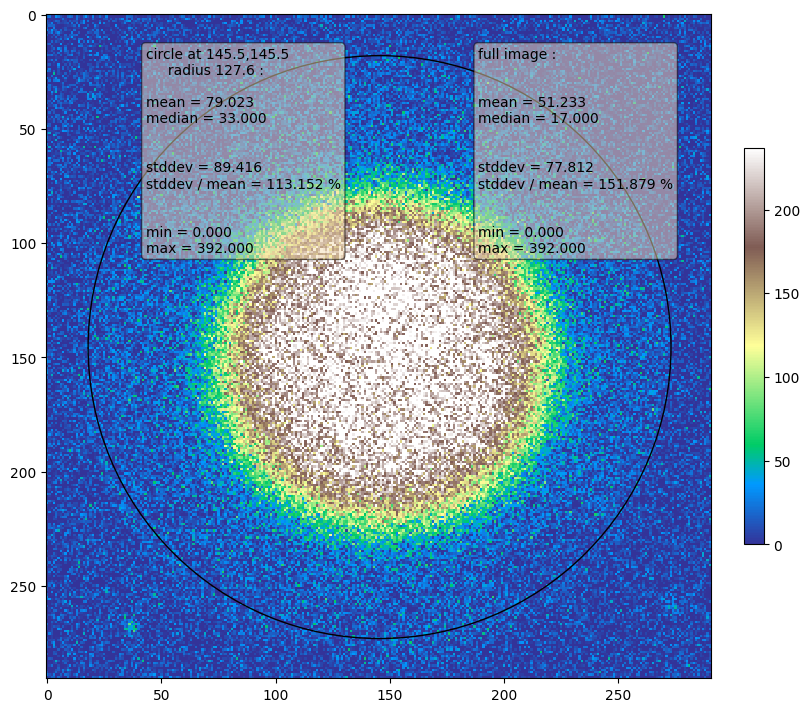

In [39]:
c1 = cut_detector(proton_det_data.data[2], min_radius_all)
fig, ax = plot_data(c1.raw.image, circle_px=c1.circle)
#c1.circle.radius * px_to_mm

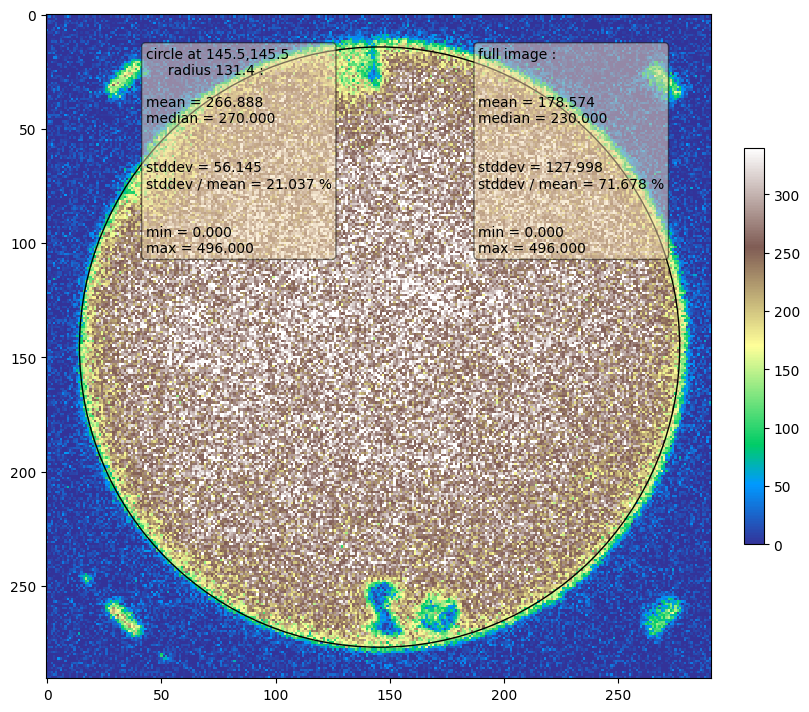

In [40]:
c1 = cut_detector(co60_det_data.data[2], min_radius_all)
fig, ax = plot_data(c1.raw.image, circle_px=c1.circle)

In [41]:
det_data_dict = {}
for data in proton_det_data.data.values():
    det_data_dict[data.det_no] = cut_detector(data, min_radius_all)
    print(f"{data.det_no} ", end='')
proton_det_cut_data = DetectorDataCollection(path=proton_det_data.path, data=det_data_dict)

2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 

In [42]:
det_data_dict = {}
for data in co60_det_data.data.values():
    det_data_dict[data.det_no] = cut_detector(data, min_radius_all)
    print(f"{data.det_no} ", end='')
co60_det_cut_data = DetectorDataCollection(path=co60_det_data.path, data=det_data_dict)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 

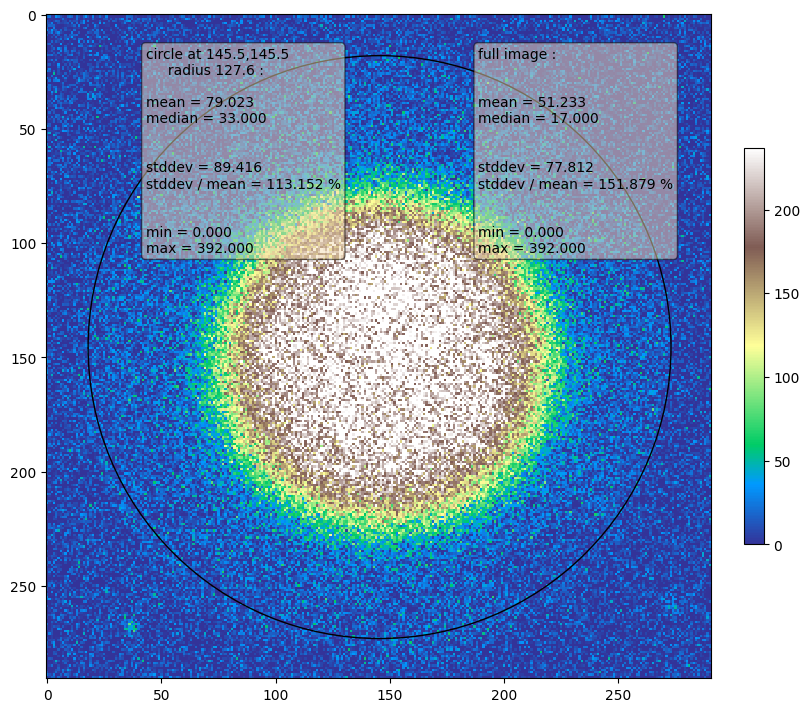

In [43]:
fig, ax = plot_data(proton_det_cut_data.data[2].raw.image, circle_px=proton_det_cut_data.data[2].circle)

# Center of mass

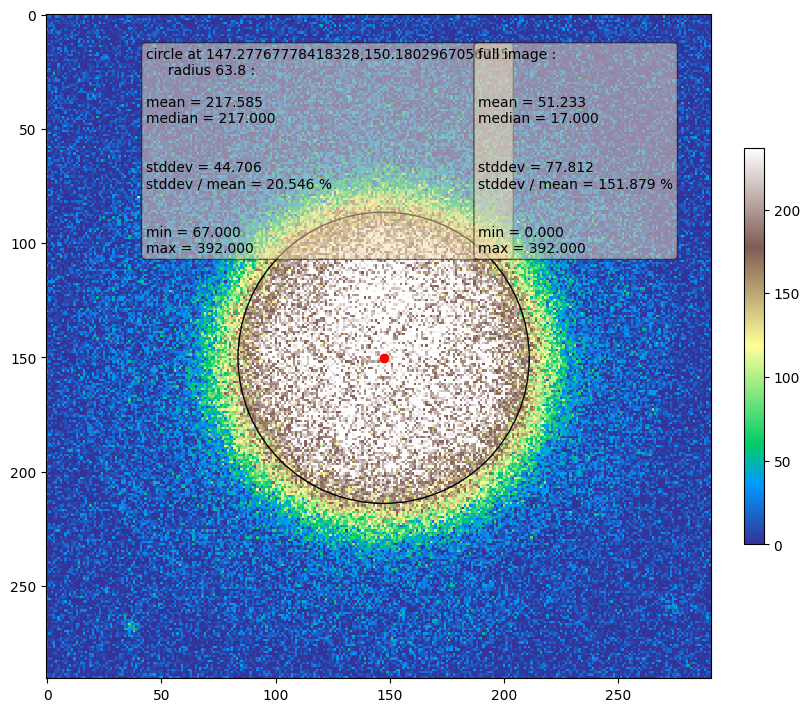

In [44]:
from scipy.ndimage import center_of_mass


r_px = 5 / px_to_mm

def center_of_mass_det(data: DetectorData) -> tuple[float, float]:
    detector_region = deepcopy(data.raw.image)
    circle_smaller_than_det = Circle(x=data.circle.x, y=data.circle.y, r=data.circle.r * 0.95)
    mask_circle = create_circular_mask(img=detector_region, circle_px=circle_smaller_than_det)
    detector_region[~mask_circle] = 0
    cm = center_of_mass(detector_region)
    return cm

det_id = 2
cm1 = center_of_mass_det(proton_det_cut_data.data[det_id])
cm1_circle = Circle(x=cm1[1], y=cm1[0], r=r_px)
fig, ax = plot_data(proton_det_cut_data.data[det_id].raw.image, circle_px=cm1_circle, clip=True)
ax.plot(cm1[1], cm1[0], 'o', color='red')

In [45]:
r_px = 5 / px_to_mm

for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path],
    [proton_det_cut_data, co60_det_cut_data]):

    # save plots from all detectors
    plot_path = plot_output_path / 'bg_sub_data'
    plot_path.mkdir(parents=True, exist_ok=True)

    # get vmax from 90% centile of all images in the circle
    vmax_list = []
    for data in dataset.data.values():
        mask = create_circular_mask(data.raw.image, data.raw.init_circle)
        percentile = np.nanpercentile(a=data.raw.image[mask], q=90)
        vmax_list.append(percentile)
    vmax = max(vmax_list)

    concatenated_flattened_data = np.concatenate([data.raw.image.flatten() for data in dataset.data.values()])
    vmin = np.nanpercentile(a=concatenated_flattened_data, q=3)
    print(f"vmin: {vmin}, vmax: {vmax}")

    for det_no, data in dataset.data.items():
        output_path = plot_path / f'det_cut_bg_sub_data_det{det_no:02d}'
        output_path.unlink(missing_ok=True)
        fig, ax = plot_data_simple(data.raw.image, circle_px=data.circle, vmin=vmin, vmax=vmax, clip=False)

        cm = center_of_mass_det(data)
        cm_circle = Circle(x=cm[1], y=cm[0], r=r_px)
        ax.plot(cm[1], cm[0], 'o', color='red')
        ax.add_artist(
            plt.Circle(xy=(cm_circle.x, cm_circle.y),
                   radius=cm_circle.r,
                   color='red',
                   fill=False,
                   transform=ax.transData))

        ax.set_title(f"Detector {det_no}")
        fig.savefig(output_path)
        plt.close(fig)

vmin: 0.0, vmax: 1004.4000000000015
vmin: 0.0, vmax: 383.0


In [46]:
# Save numpy data to disk for calculation of profiles

for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path],
    [proton_det_cut_data, co60_det_cut_data]):
    npy_path = plot_output_path / 'bg_sub_data'
    npy_path.mkdir(parents=True, exist_ok=True)
    for det_no, data in dataset.data.items():
        output_path = npy_path / f'data_det{det_no:02d}'
        np.save(arr=data.raw.image, file=output_path)

# Mean signal inspection

In [47]:
min_radius_all
singal_radius = 0.5 * min_radius_all
singal_radius

61.0

In [48]:
from collections import defaultdict
import pandas as pd
df_data = defaultdict(list)
for data in proton_det_cut_data.data.values():
    #mask = create_circular_mask(img=data.raw.image, circle_px=Circle(x=data.circle.x, y=data.circle.y, r=singal_radius))
    cm = center_of_mass_det(data)
    cm_circle = Circle(x=cm[1], y=cm[0], r=60)
    mask = create_circular_mask(img=data.raw.image, circle_px=cm_circle)
    df_data["det_no"] += [int(data.det_no)]
    df_data["mean_signal"] += [np.mean(data.raw.image[mask])]
    df_data["std_signal"] += [np.std(data.raw.image[mask])]
    df_data["radiation"] += ["proton"]
for data in co60_det_cut_data.data.values():
    mask = create_circular_mask(img=data.raw.image, circle_px=Circle(x=data.circle.x, y=data.circle.y, r=singal_radius))
    df_data["det_no"] += [int(data.det_no)]
    df_data["mean_signal"] += [np.mean(data.raw.image[mask])]
    df_data["std_signal"] += [np.std(data.raw.image[mask])]
    df_data["radiation"] += ["Co60"]
df = pd.DataFrame(df_data)
df.sort_values(by=["radiation","det_no"], inplace=True)
df

,det_no,mean_signal,std_signal,radiation
15,1,299.907994,44.402650,Co60
16,2,292.648922,44.421143,Co60
17,3,264.587641,41.910255,Co60
18,4,300.549041,44.857696,Co60
19,5,294.296303,44.178711,Co60
20,6,265.496919,42.239628,Co60
21,7,291.379065,44.390484,Co60
22,8,267.703269,41.219545,Co60
23,9,281.275077,43.308324,Co60
24,10,283.048100,42.867166,Co60


<Axes: xlabel='det_no'>

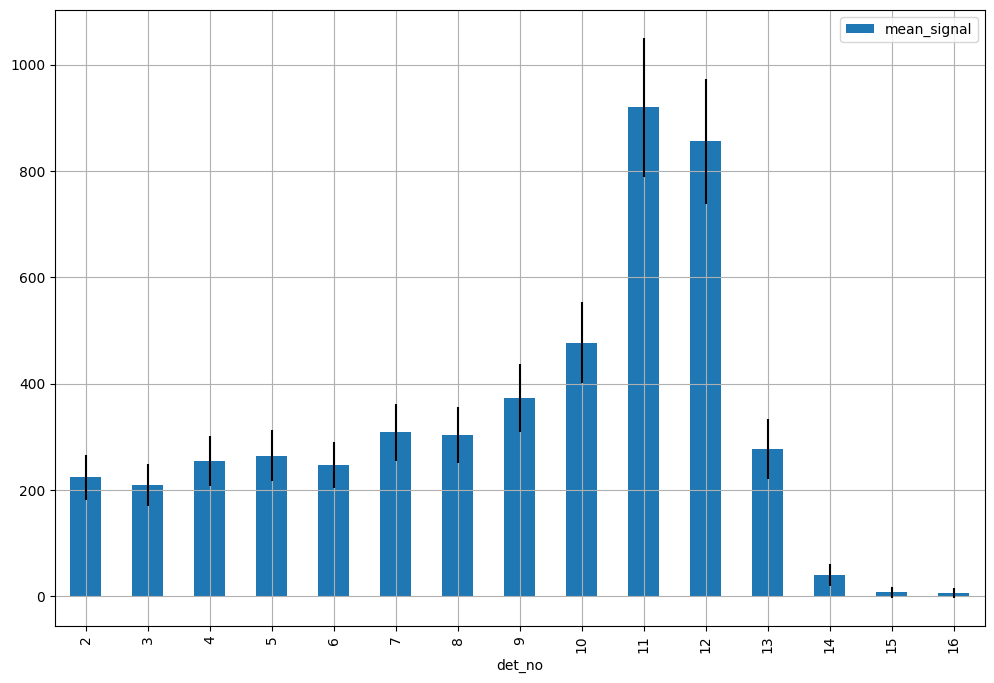

In [49]:
df[df.radiation == 'proton'].plot(x='det_no', y='mean_signal', yerr='std_signal', kind='bar', figsize=(12, 8), grid=True)

<Axes: xlabel='det_no'>

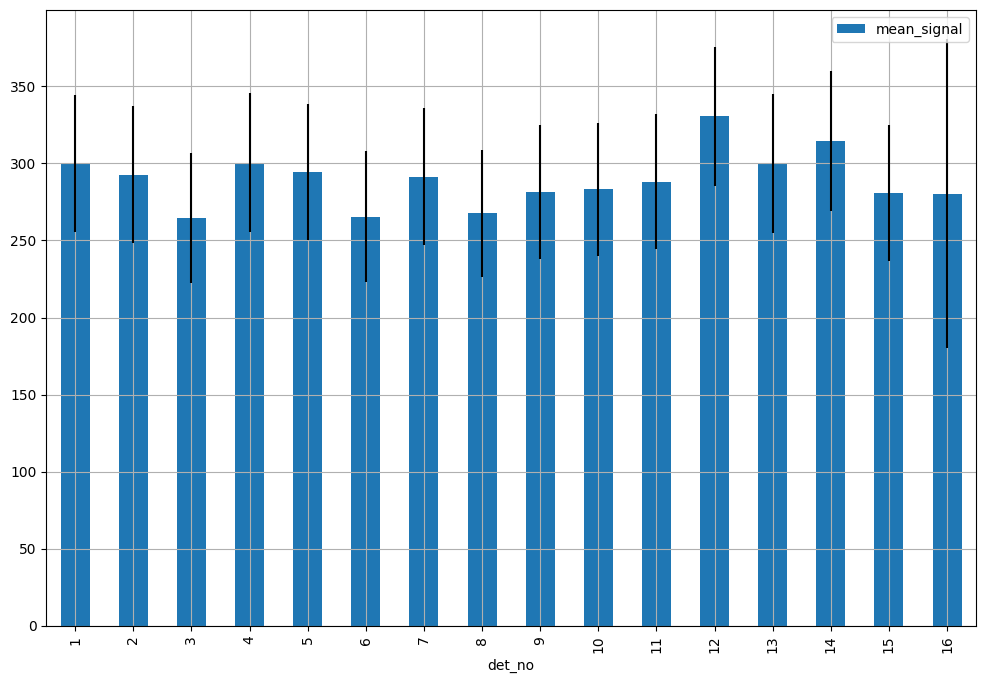

In [50]:
df[df.radiation == 'Co60'].plot(x='det_no', y='mean_signal', yerr='std_signal', kind='bar', figsize=(12, 8), grid=True)

# Good dataset selection

In [51]:
det_data_dict = {}
for data in proton_det_cut_data.data.values():
    if data.det_no <= 15:
        det_data_dict[data.det_no] = data
        print(f"{data.det_no} ", end='')
proton_det_sel_data = DetectorDataCollection(path=proton_det_cut_data.path, data=det_data_dict)

2 3 4 5 6 7 8 9 10 11 12 13 14 15 

In [52]:
det_data_dict = {}
for data in co60_det_cut_data.data.values():
    if data.det_no >= 2 and data.det_no <= 15:
        det_data_dict[data.det_no] = data
        print(f"{data.det_no} ", end='')
co60_det_sel_data = DetectorDataCollection(path=co60_det_cut_data.path, data=det_data_dict)

2 3 4 5 6 7 8 9 10 11 12 13 14 15 

In [53]:
import random
import math
num_circles = 1000
small_radius = 10
shift_x, shift_y = [], []
min_radius_all = 60
for _ in range(num_circles):
    angle = random.uniform(0, 2*np.pi)
    distance = random.uniform(0, 0.8*min_radius_all-small_radius)
    shift_x.append(distance * math.cos(angle))
    shift_y.append(distance * math.sin(angle))

In [54]:
df_data = defaultdict(list)
for data in proton_det_sel_data.data.values():
    for circle_no in range(num_circles):
        circle = Circle(x=data.circle.x + shift_x[circle_no], y=data.circle.y + shift_y[circle_no], r=small_radius)
        mask = create_circular_mask(img=data.raw.image, circle_px=circle)
        df_data["det_no"] += [int(data.det_no)]
        df_data["mean_signal"] += [np.mean(data.raw.image[mask])]
        df_data["std_signal"] += [np.std(data.raw.image[mask])]
        df_data["radiation"] += ["proton"]
        df_data["circle_no"] += [circle_no]
for data in co60_det_sel_data.data.values():
    for circle_no in range(num_circles):
        circle = Circle(x=data.circle.x + shift_x[circle_no], y=data.circle.y + shift_y[circle_no], r=small_radius)
        mask = create_circular_mask(img=data.raw.image, circle_px=circle)
        df_data["det_no"] += [int(data.det_no)]
        df_data["mean_signal"] += [np.mean(data.raw.image[mask])]
        df_data["std_signal"] += [np.std(data.raw.image[mask])]
        df_data["radiation"] += ["Co60"]
        df_data["circle_no"] += [circle_no]
df = pd.DataFrame(df_data)
df.sort_values(by=["radiation","det_no"], inplace=True)
df

,det_no,mean_signal,std_signal,radiation,circle_no
14000,2,306.156550,43.518911,Co60,0
14001,2,292.859873,48.448799,Co60,1
14002,2,288.587859,42.499909,Co60,2
14003,2,300.466454,45.809367,Co60,3
14004,2,290.713376,44.898903,Co60,4
...,...,...,...,...,...
13995,15,6.559105,9.644008,proton,995
13996,15,8.476190,10.561170,proton,996
13997,15,8.191083,10.064527,proton,997
13998,15,7.533762,10.089215,proton,998


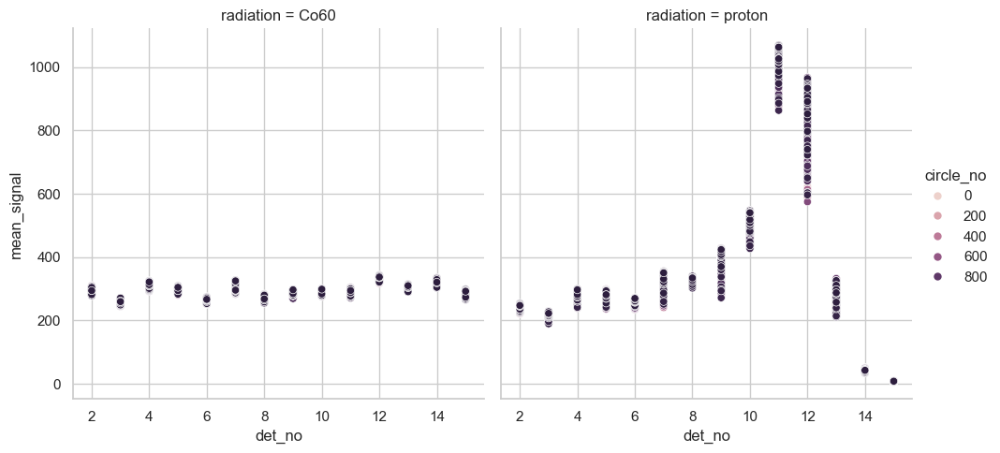

In [55]:
import seaborn as sns
sns.set_theme(style="whitegrid")
sns.relplot(x="det_no", y="mean_signal", hue="circle_no", col="radiation", data=df)

In [56]:
df2 = pd.DataFrame()
df2["mean"] = df.groupby(["radiation", "det_no"])["mean_signal"].mean()
df2["std"] = df.groupby(["radiation", "det_no"])["mean_signal"].std()
df2

mean        std
radiation det_no                        
Co60      2        293.936709   5.575225
          3        259.426506   5.391380
          4        307.094836   8.348127
          5        298.441264   4.744503
          6        263.147244   4.990214
          7        306.192100  12.802141
          8        268.815330   3.982586
          9        286.862969   4.806083
          10       289.181985   5.627045
          11       291.188390   6.645494
          12       334.367696   4.546467
          13       304.648096   5.390569
          14       317.638675   6.022661
          15       285.443545   7.667429
proton    2        240.792655   6.211430
          3        218.557980   6.284001
          4        277.385370  11.421753
          5        282.159973  11.315455
          6        261.080316   5.595476
          7        330.243048  21.131368
          8        329.076456   5.740095
          9        403.257083  28.166968
          10       522.177667  23.156545
          11      1028.014744  38.804937
          12       880.602700  75.087055
          13       279.803676  22.437064
          14        39.887092   2.666485
          15         7.422178   0.630406

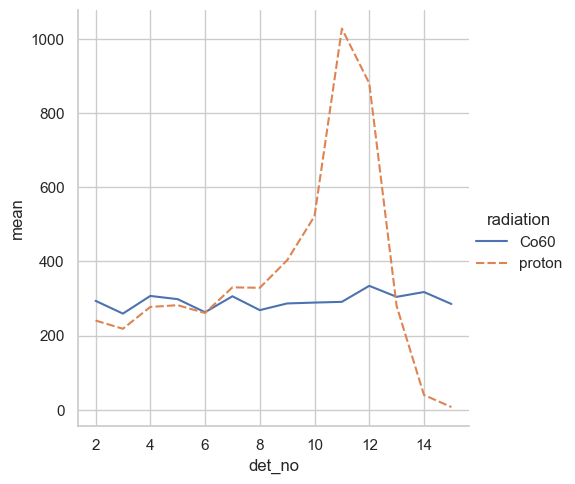

In [57]:
sns.relplot(data=df2.reset_index(), x='det_no', y='mean', hue='radiation', style='radiation', kind='line')

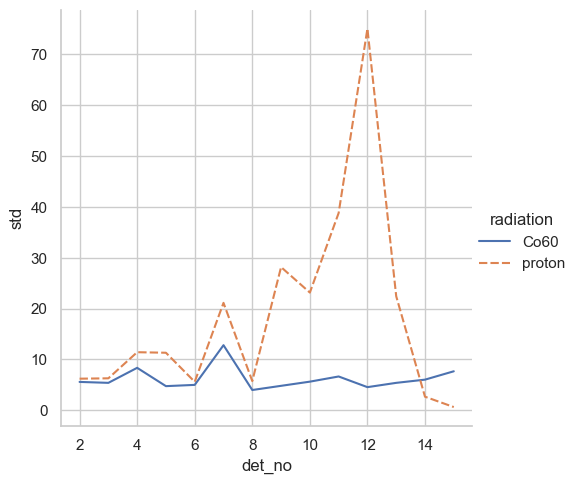

In [58]:
sns.relplot(data=df2.reset_index(), x='det_no', y='std', hue='radiation', style='radiation', kind='line')

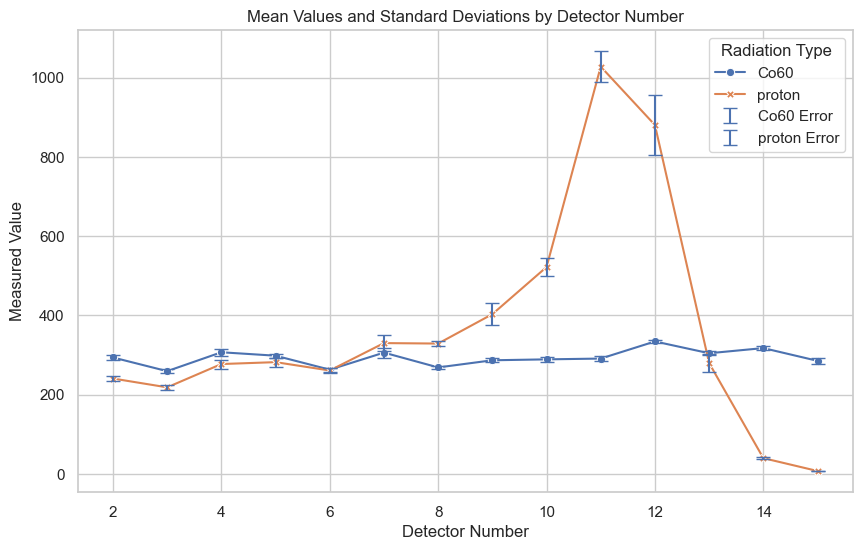

In [59]:
# Reset the index if df2 is a MultiIndex DataFrame
df2_reset = df2.reset_index()

# Create a figure and axis object
plt.figure(figsize=(10, 6))

# Plot the mean values with line and scatter points
sns.lineplot(data=df2_reset, x='det_no', y='mean', hue='radiation', style='radiation', markers=True, dashes=False)

# Add error bars
for radiation_type in df2_reset['radiation'].unique():
    subset = df2_reset[df2_reset['radiation'] == radiation_type]
    plt.errorbar(subset['det_no'], subset['mean'], yerr=subset['std'], fmt='none', capsize=5, label=f'{radiation_type} Error')

plt.title('Mean Values and Standard Deviations by Detector Number')
plt.xlabel('Detector Number')
plt.ylabel('Measured Value')
plt.legend(title='Radiation Type')

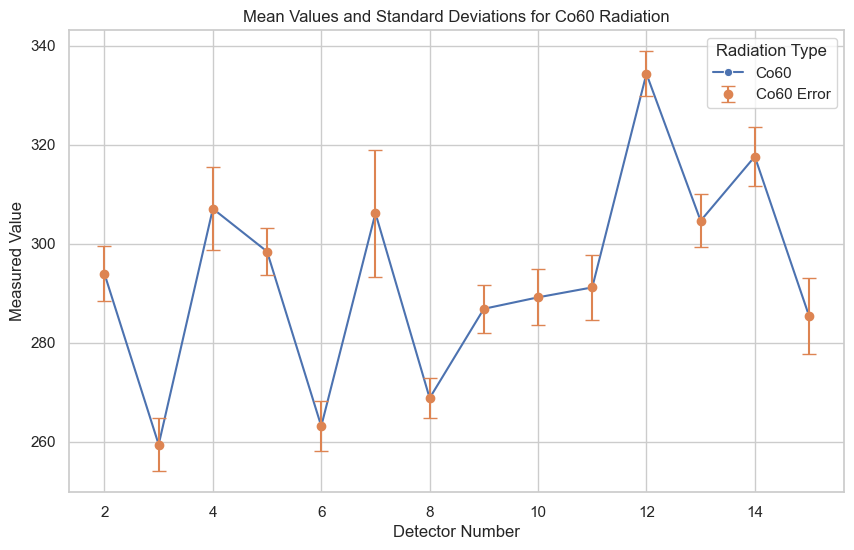

In [60]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df2 is already defined and includes 'mean' and 'std' columns for each 'det_no' for different 'radiation' conditions.

# Reset the index if df2 is a MultiIndex DataFrame
df2_reset = df2.reset_index()

# Filter the data for 'Co60' radiation
df2_co60 = df2_reset[df2_reset['radiation'] == 'Co60']

# Create a figure and axis object
plt.figure(figsize=(10, 6))

# Plot the mean values with line and scatter points for Co60
sns.lineplot(data=df2_co60, x='det_no', y='mean', hue='radiation', style='radiation', markers=True, dashes=False)

# Add error bars for Co60
plt.errorbar(df2_co60['det_no'], df2_co60['mean'], yerr=df2_co60['std'], fmt='o', capsize=5, label='Co60 Error')

plt.title('Mean Values and Standard Deviations for Co60 Radiation')
plt.xlabel('Detector Number')
plt.ylabel('Measured Value')
plt.legend(title='Radiation Type')

In [61]:
path_interim = project_dir / 'data' / 'interim'
path_interim.mkdir(parents=True, exist_ok=True)
df.to_hdf(path_interim / 'data.h5', key='df', mode='w')